# Clustering en Imágenes

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from sklearn.cluster import KMeans

# Función para mostrar imágenes
def mostrar_imagen(imagen, titulo=""):
    plt.figure(figsize=(10, 10)) # tamaño de 10x10
    plt.imshow(imagen, cmap='gray')
    plt.title(titulo)
    plt.axis('off')
    plt.show()


## Ejemplo 1: Aplicar segmentación a una imagen de tomografía computarizada (CT)

--2025-12-04 18:12:46--  https://cdn.storymd.com/optimized/rA3lwrs4oM/original.jpg
Resolving cdn.storymd.com (cdn.storymd.com)... 3.163.189.55, 3.163.189.95, 3.163.189.36, ...
Connecting to cdn.storymd.com (cdn.storymd.com)|3.163.189.55|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 70880 (69K) [image/jpeg]
Saving to: ‘imagen_medica.jpg’

imagen_medica.jpg   100%[===================>]  69.22K  --.-KB/s    in 0.01s   

2025-12-04 18:12:46 (6.77 MB/s) - ‘imagen_medica.jpg’ saved [70880/70880]



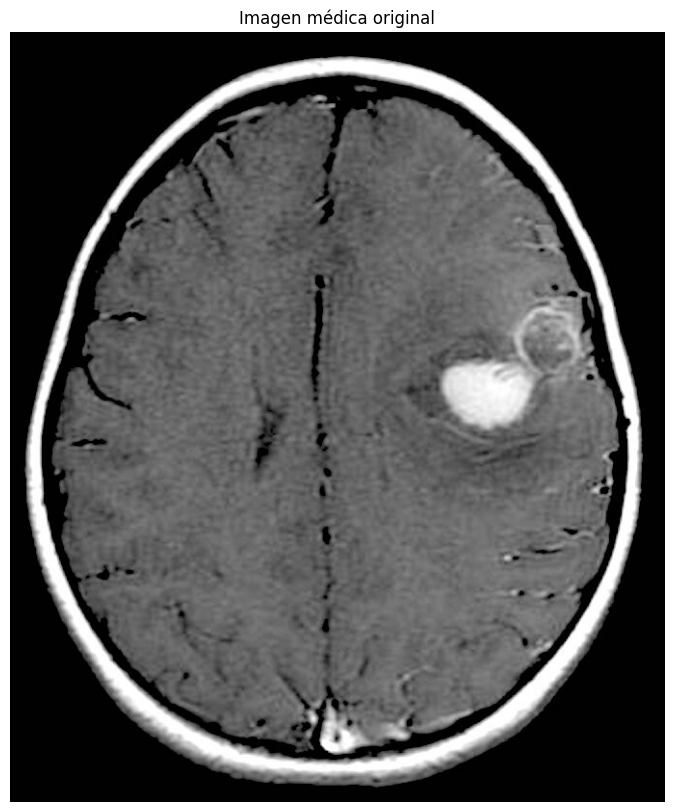

In [ ]:
# Descarga una imagen médica desde internet y la guarda con el nombre 'imagen_medica.jpg'
!wget -O imagen_medica.jpg "https://cdn.storymd.com/optimized/rA3lwrs4oM/original.jpg"

# Importa la biblioteca OpenCV para procesamiento de imágenes
import cv2

# Lee la imagen descargada desde el disco usando OpenCV
imagen_medica = cv2.imread('imagen_medica.jpg')

# Muestra la imagen en una ventana con el título "Imagen Médica Original"
# Esta función mostrar_imagen debe haber sido definida anteriormente en el código
mostrar_imagen(imagen_medica,"Imagen médica original")


## Utilizano Kmeans para el análisis de imágenes

La función KMeans de sklearn.cluster aplica el algoritmo de K-Means, una técnica de aprendizaje no supervisado que agrupa datos similares en K grupos o clústeres, basándose en su cercanía a centros o centroides.

### Aplicado a imágenes en escala de grises



```
imagen_gris.reshape(-1, 1)
```
Convierte la imagen de una matriz 2D a una lista 1D de valores de píxeles, donde cada valor representa la intensidad de gris de un píxel (entre 0 y 255).


> Esto transforma la imagen en un conjunto de datos de entrenamiento para K-Means, donde cada píxel es una instancia.



```
KMeans(n_clusters=2)
```
Le dice al algoritmo que forme 2 grupos (clústeres). En imágenes médicas, esto suele servir para separar:
* Clúster 1: fondo u oscuridad
* Clúster 2: tejido, hueso, anomalías, etc.



```
.fit(pixels)
```
Ejecuta el entrenamiento:
* El algoritmo elige dos centros iniciales (aleatorios).
* Asigna cada píxel al centro más cercano según su valor de gris (distancia euclidiana).
* Recalcula los centros promediando los valores de los píxeles asignados a cada grupo.
* Repite este proceso hasta que los centros no cambien significativamente (convergencia).




```
kmeans.labels_
```
Devuelve una etiqueta (0 o 1 en este caso) para cada píxel, indicando a qué clúster pertenece.



```
reshape(imagen_gris.shape)
```
Reconstruye la imagen segmentada con la misma forma original, pero ahora cada píxel tiene un valor de clúster (0 o 1).







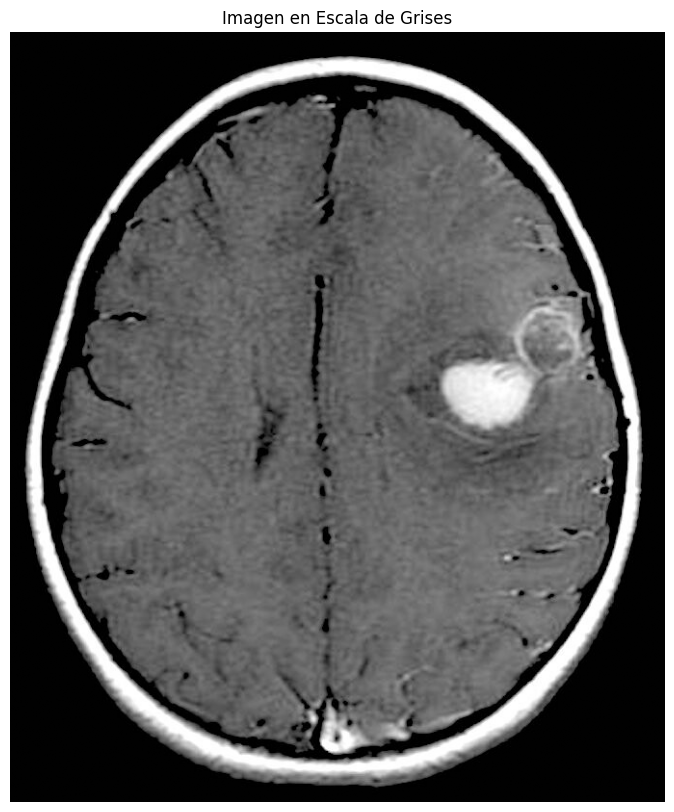

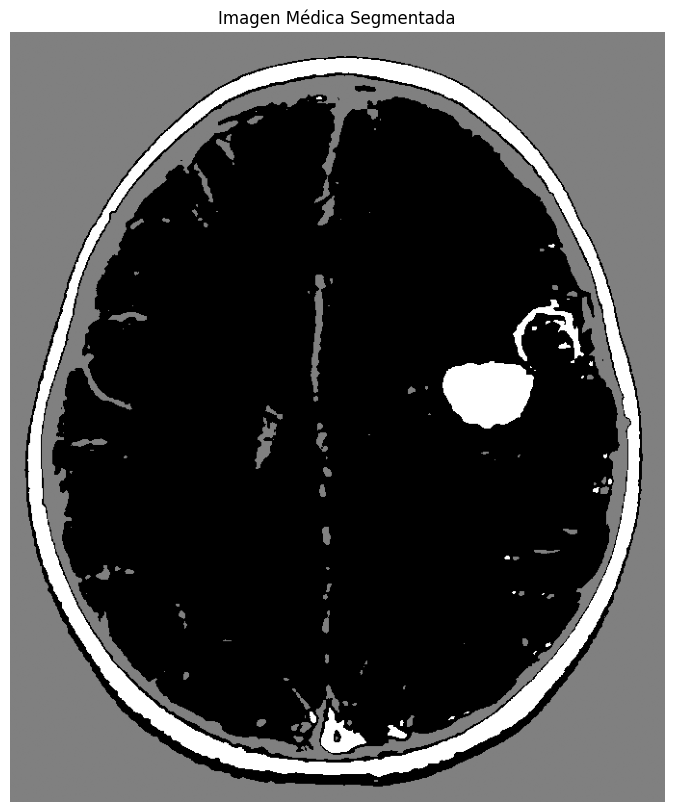

In [ ]:
# Convertir la imagen a escala de grises (para simplificar la segmentación)
imagen_gris = cv2.cvtColor(imagen_medica, cv2.COLOR_BGR2GRAY).astype(np.uint8)

# Mostrar la imagen en escala de grises
mostrar_imagen(imagen_gris, "Imagen en Escala de Grises")

# Reorganizar los píxeles para aplicarlos a K-Means (de 2D a 1D)
pixels = imagen_gris.reshape(-1,1)

# Aplicar el algoritmo K-Means con 2 clústeres (por ejemplo: fondo y tejido)

# Probar con n_clusters = 3
kmeans = KMeans(n_clusters=3, random_state=42).fit(pixels)

# Obtener las etiquetas de clúster y reestructurarlas al tamaño original de la imagen
segmentada = kmeans.labels_.reshape(imagen_gris.shape)

# Mostrar la imagen segmentada
mostrar_imagen(segmentada, "Imagen Médica Segmentada")

## Ejemplo 2: Detección de Objetos en Imágenes Satelitales
Identificar y clasificar diferentes tipos de terrenos en una imagen satelital diferente

--2025-12-04 18:12:57--  https://c4.wallpaperflare.com/wallpaper/255/737/248/planet-earth-surface-land-wallpaper-preview.jpg
Resolving c4.wallpaperflare.com (c4.wallpaperflare.com)... 172.67.210.157, 104.21.77.174, 2606:4700:3031::6815:4dae, ...
Connecting to c4.wallpaperflare.com (c4.wallpaperflare.com)|172.67.210.157|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 102246 (100K) [image/jpeg]
Saving to: ‘imagen_satelital.jpg’

imagen_satelital.jp 100%[===================>]  99.85K   191KB/s    in 0.5s    

2025-12-04 18:12:58 (191 KB/s) - ‘imagen_satelital.jpg’ saved [102246/102246]



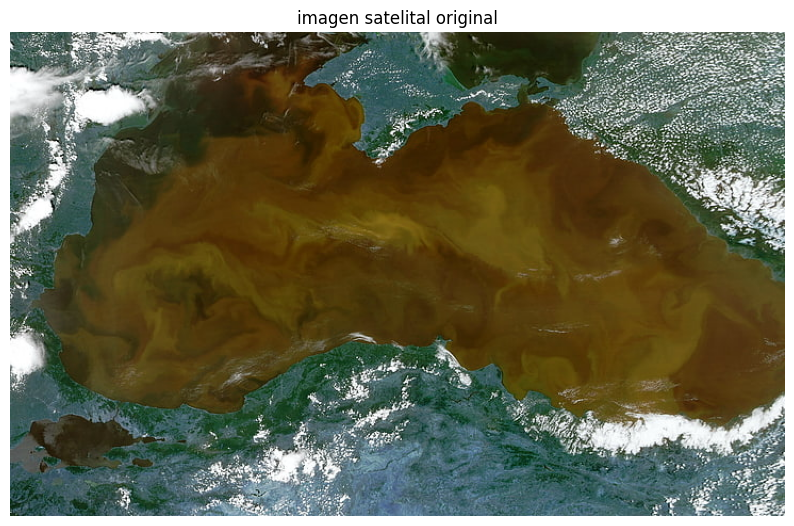

In [ ]:
!wget -O imagen_satelital.jpg https://c4.wallpaperflare.com/wallpaper/255/737/248/planet-earth-surface-land-wallpaper-preview.jpg
imagen_satelital = cv2.imread('imagen_satelital.jpg')
mostrar_imagen(imagen_satelital, "imagen satelital original")

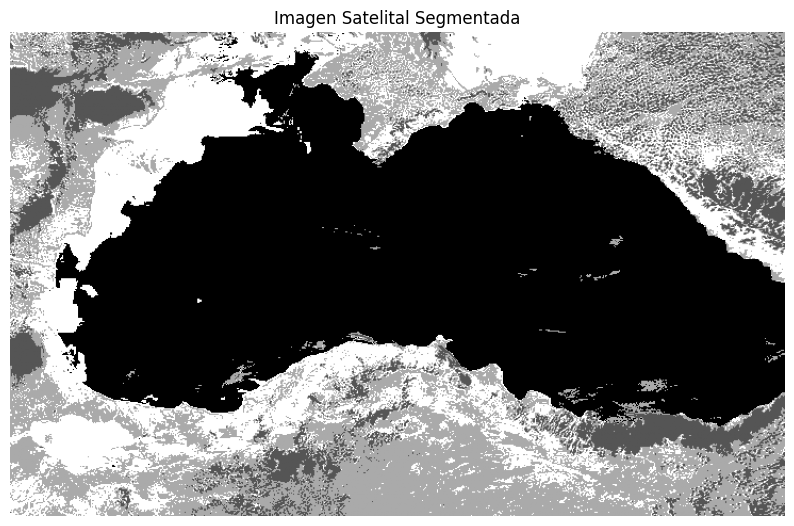

In [ ]:
imagen_rgb = cv2.cvtColor(imagen_satelital, cv2.COLOR_BGR2RGB)
pixels_rgb = imagen_rgb.reshape(-1, 3)

kmeans = KMeans(n_clusters=4, random_state=42).fit(pixels_rgb)
segmentada_rgb = kmeans.labels_.reshape(imagen_rgb.shape[:2])

mostrar_imagen(segmentada_rgb, "Imagen Satelital Segmentada")

## Ejemplo 3: Compresión de Imágenes mediante K-Means

--2025-12-04 18:13:05--  https://inah.gob.mx/images/fotodeldia/20231229_fotodia_AcueductoQueretarointro.jpg
Resolving inah.gob.mx (inah.gob.mx)... 187.217.15.186
Connecting to inah.gob.mx (inah.gob.mx)|187.217.15.186|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 232885 (227K) [image/jpeg]
Saving to: ‘imagen_compresion.jpg’

imagen_compresion.j 100%[===================>] 227.43K  1.23MB/s    in 0.2s    

2025-12-04 18:13:06 (1.23 MB/s) - ‘imagen_compresion.jpg’ saved [232885/232885]



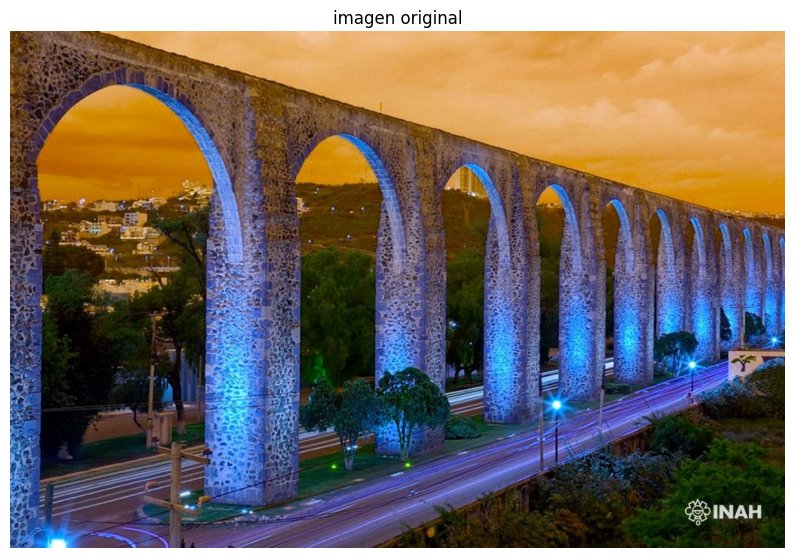

In [ ]:
!wget -O imagen_compresion.jpg "https://inah.gob.mx/images/fotodeldia/20231229_fotodia_AcueductoQueretarointro.jpg" --no-check-certificate
imagen_compresion = cv2.imread('imagen_compresion.jpg')
mostrar_imagen(imagen_compresion, "imagen original")



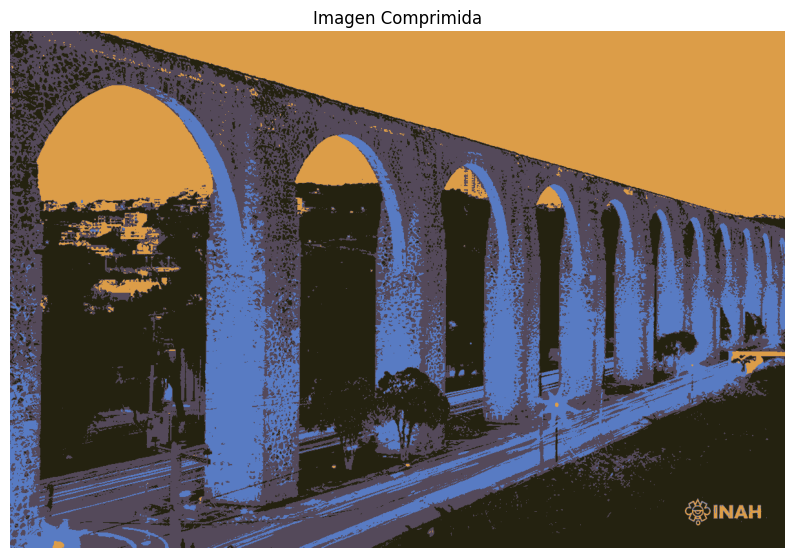

In [ ]:
# Convertir la imagen a una matriz 2D de píxeles con 3 valores (RGB) por fila
pixels_rgb = imagen_compresion.reshape(-1, 3) # valores rgb -1, 3

# Aplicar K-Means para agrupar los colores en 16 clusters (reducir la paleta de colores)
kmeans = KMeans(n_clusters=4, random_state=42).fit(pixels_rgb)

# Reemplazar cada píxel con el color del centroide del cluster asignado
compressed_img = kmeans.cluster_centers_[kmeans.labels_]

# Reconstruir la imagen a su forma original (alto, ancho, 3)
compressed_img = compressed_img.reshape(imagen_compresion.shape)

# Mostrar la imagen comprimida (convertir a uint8 para visualización correcta)
mostrar_imagen(compressed_img.astype(np.uint8), "Imagen Comprimida")


# técnicas de clustering para analizar y segmentar una imagen real


## Transformaciones Geométricas

Las transformaciones geométricas permiten modificar la orientación, posición o escala de una imagen. Son útiles para aumentar los datos (data augmentation), corregir imágenes o simular condiciones diferentes.

**Operaciones comunes:**
- **Rotación**
- **Traslación (desplazamiento)**
- **Escalado**
- **Volteo horizontal/vertical**


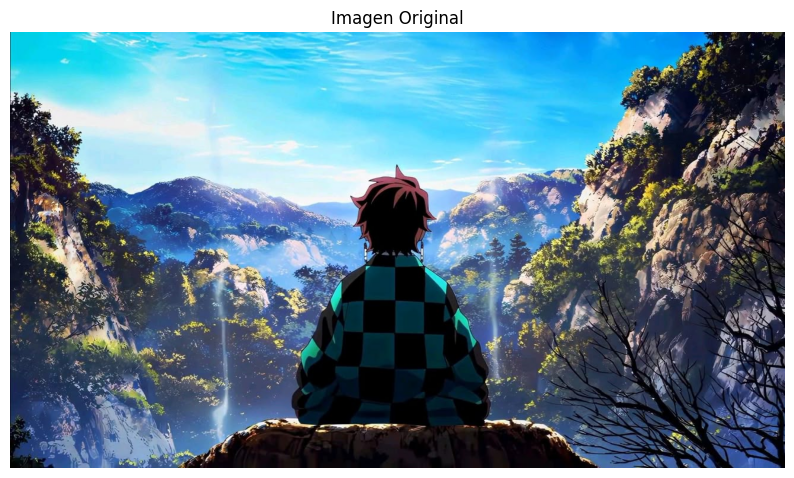

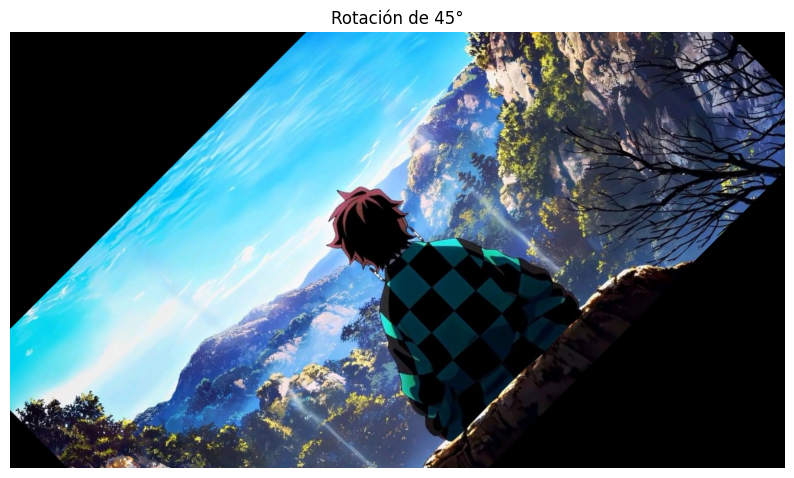

In [ ]:

# Cargar imagen de ejemplo
imagen = cv2.imread('/content/sample_data/kimetsu.jpg')
#imagen = imagen_compresion #Línea añadida
imagen_rgb = cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB)
mostrar_imagen(imagen_rgb, "Imagen Original")

# Rotación
# Obtener la altura (h) y anchura (w) de la imagen
(h, w) = imagen.shape[:2]

# Calcular el punto central de la imagen (centro de rotación)
centro = (w // 2, h // 2)

# Crear la matriz de transformación para rotar la imagen 45 grados alrededor del centro, sin escalado (1.0) se deja en la escala original
M = cv2.getRotationMatrix2D(centro, 45, 1.0)

# Aplicar la transformación de rotación a la imagen usando la matriz M
# El tamaño de la salida se mantiene igual (w, h)
rotada = cv2.warpAffine(imagen, M, (w, h))

# Mostrar la imagen rotada, convertida de BGR a RGB para visualización correcta
mostrar_imagen(cv2.cvtColor(rotada, cv2.COLOR_BGR2RGB), "Rotación de 45°")




## Filtrado y Realce de Imágenes

Los filtros ayudan a reducir ruido o a destacar ciertas características como bordes.

**Técnicas comunes:**
- Desenfoque Gaussiano
- Desenfoque de Mediana
- Detección de Bordes (Canny)


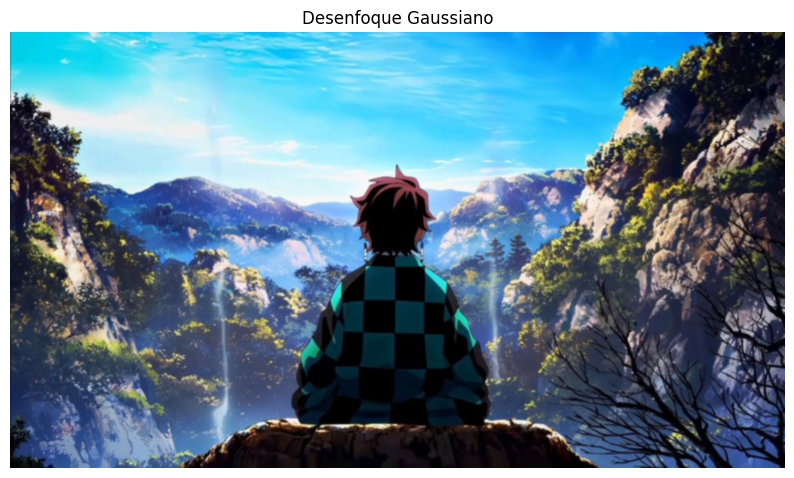

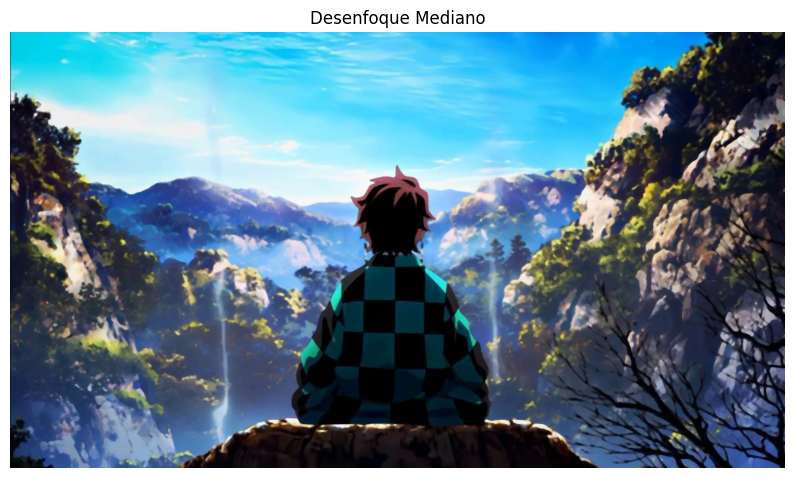

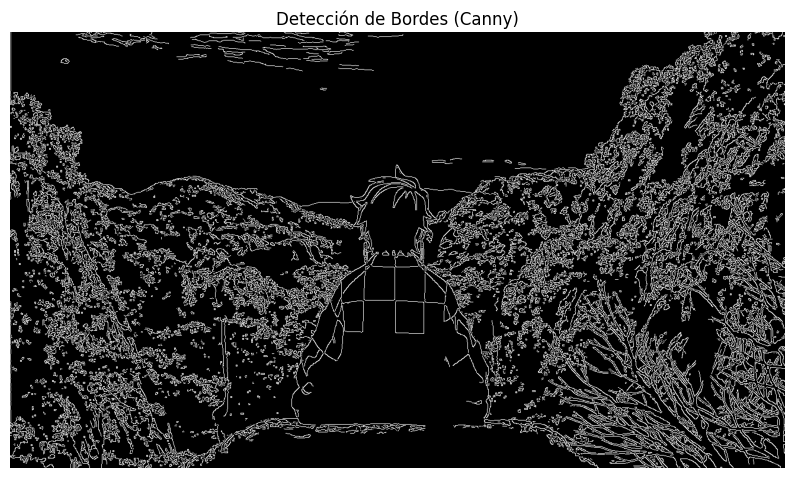

In [ ]:

# Aplicar filtro de suavizado Gaussiano con un kernel de 5x5 y desviación estándar 0
gauss = cv2.GaussianBlur(imagen, (5,5), 0)

# Aplicar filtro de suavizado mediano con un tamaño de kernel de 5 (reduce ruido sal y pimienta)
median = cv2.medianBlur(imagen, 5)

# Mostrar la imagen suavizada con filtro Gaussiano (convertida de BGR a RGB para correcta visualización)
mostrar_imagen(cv2.cvtColor(gauss, cv2.COLOR_BGR2RGB), "Desenfoque Gaussiano")

# Mostrar la imagen suavizada con filtro Mediano (convertida de BGR a RGB para correcta visualización)
mostrar_imagen(cv2.cvtColor(median, cv2.COLOR_BGR2RGB), "Desenfoque Mediano")

# Aplicar detector de bordes Canny con umbrales 100 y 200 para detectar bordes fuertes y débiles
bordes = cv2.Canny(imagen,100,200) # 100 y 200 -> la sensibilidad

# Mostrar la imagen resultado de la detección de bordes
mostrar_imagen(bordes, "Detección de Bordes (Canny)")



## Espacios de Color

Los espacios de color permiten representar la información de forma diferente, útil para tareas como segmentación o detección.

**Ejemplos:**
- Grayscale
- HSV (tono, saturación, valor)
- LAB (luminosidad, color)



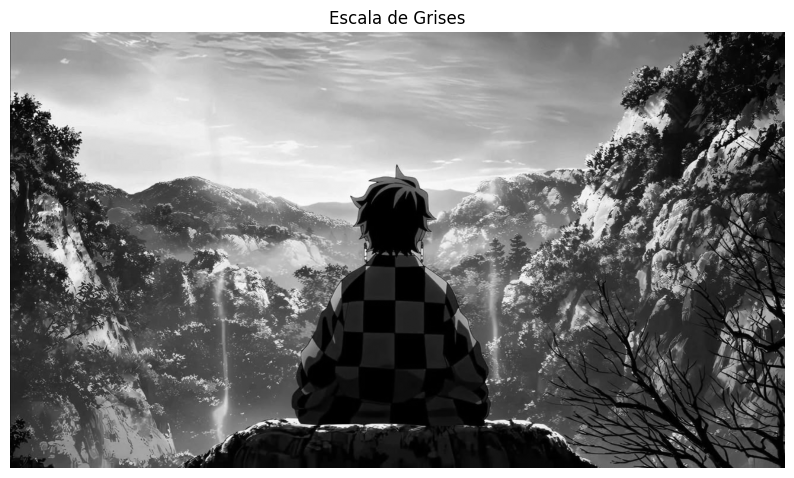

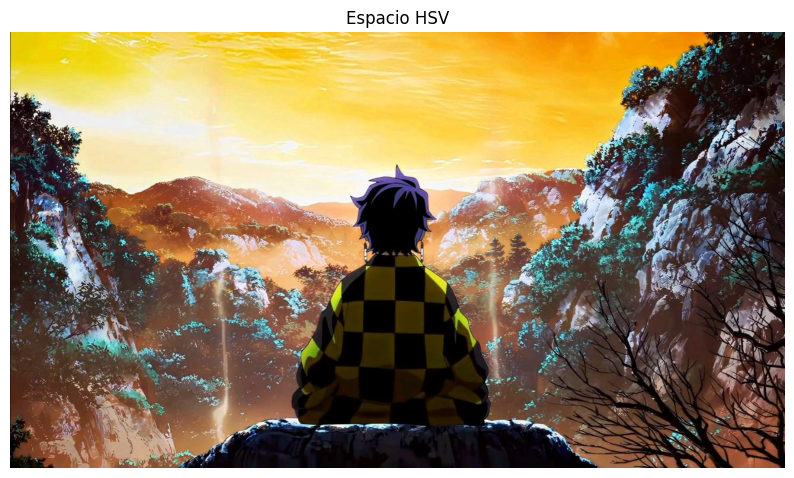

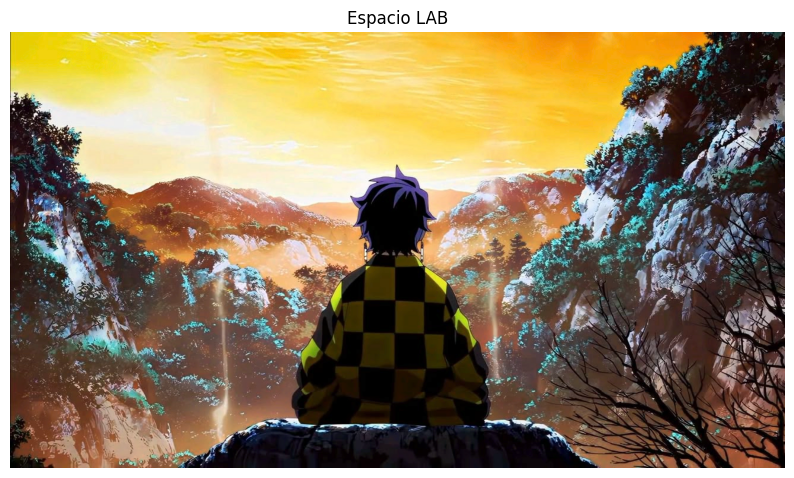

In [ ]:

# Convertir la imagen de BGR (formato OpenCV) a escala de grises
gris = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)

# Convertir la imagen de BGR a espacio de color HSV (Hue, Saturation, Value)
hsv = cv2.cvtColor(imagen, cv2.COLOR_BGR2HSV)

# Convertir la imagen de BGR a espacio de color LAB (Luz, A y B, que representan luminosidad y dos canales de color)
lab = cv2.cvtColor(imagen, cv2.COLOR_BGR2LAB)

# Mostrar la imagen en escala de grises con título "Escala de Grises"
mostrar_imagen(gris, "Escala de Grises")

# Convertir de HSV a RGB para mostrar la imagen correctamente y mostrarla con título "Espacio HSV"
mostrar_imagen(cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR), "Espacio HSV")

# Convertir de LAB a RGB para mostrar la imagen correctamente y mostrarla con título "Espacio LAB"
mostrar_imagen(cv2.cvtColor(lab, cv2.COLOR_LAB2BGR), "Espacio LAB")




## Máscaras y Operaciones Morfológicas

Las operaciones morfológicas trabajan sobre máscaras binarias y son útiles para limpiar ruido o unir regiones segmentadas.

**Ejemplos:**
- Erosión
- Dilatación
- Apertura
- Cierre


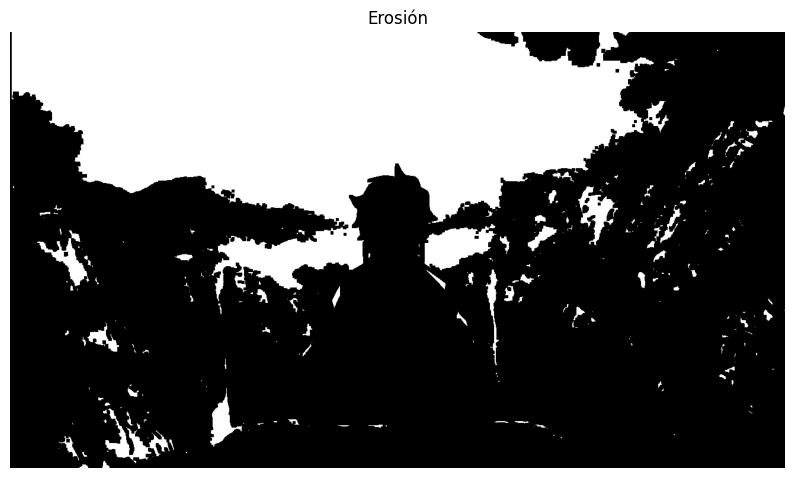

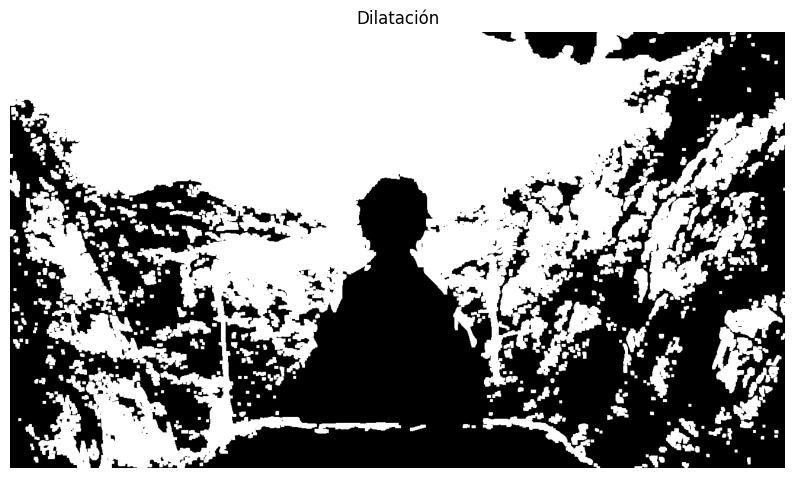

In [ ]:

# Convertir la imagen de BGR a escala de grises
gris = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)

# Aplicar umbral binario para crear una máscara:
# píxeles con valor >127 se convierten en 255 (blanco), otros en 0 (negro)
_, binaria = cv2.threshold(gris, 127, 255, cv2.THRESH_BINARY)

# Crear un kernel (matriz) de 5x5 de unos para operaciones morfológicas
kernel = np.ones((5,5), np.uint8)

# Aplicar erosión para eliminar ruido pequeño y separar objetos
# Desgasta los bordes blancos (255) en la máscara
erosion = cv2.erode(binaria, kernel, iterations=1)

# Aplicar dilatación para aumentar el área blanca en la máscara
# Engrosa los bordes blancos, útil para recuperar áreas después de la erosión
dilatacion = cv2.dilate(binaria, kernel, iterations=1)

# Mostrar la imagen después de la erosión con título "Erosión"
mostrar_imagen(erosion, "Erosión")

# Mostrar la imagen después de la dilatación con título "Dilatación"
mostrar_imagen(dilatacion, "Dilatación")




## Detección de Contornos

Los contornos permiten detectar formas u objetos en una imagen segmentada o binaria.



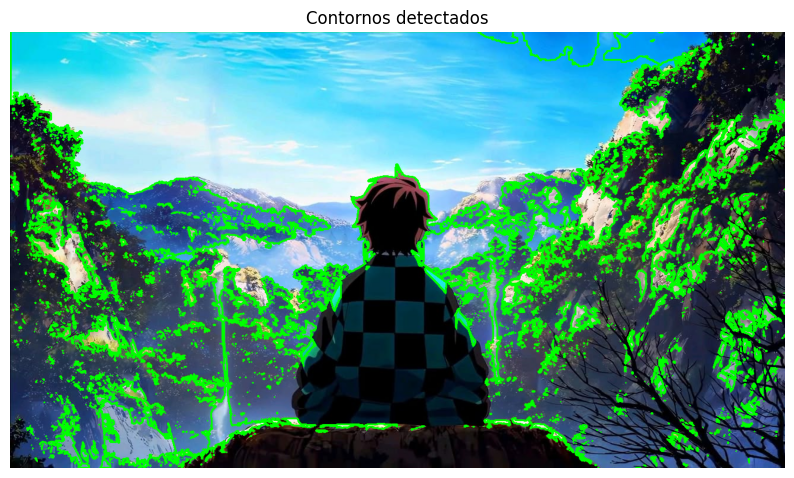

In [ ]:
# Encontrar contornos en la imagen binaria
# cv2.RETR_EXTERNAL: solo recupera los contornos externos
# cv2.CHAIN_APPROX_SIMPLE: comprime los contornos eliminando puntos redundantes
contornos, _ = cv2.findContours(binaria, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Crear una copia de la imagen original para dibujar los contornos sin modificar la original
contorno_img = imagen.copy()

# Dibujar todos los contornos encontrados en verde (0,255,0) con un grosor de 2 píxeles
cv2.drawContours(contorno_img, contornos, -1, (0,255,0), 2)

# Mostrar la imagen con contornos detectados, convirtiendo de BGR a RGB para correcta visualización
mostrar_imagen(cv2.cvtColor(contorno_img, cv2.COLOR_BGR2RGB), "Contornos detectados")


## Analizador de frutas

In [ ]:
# Librerías necesarias
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os
from sklearn.cluster import KMeans
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

# Función para mostrar imágenes
def mostrar_imagen(img, titulo=""):
    plt.figure(figsize=(5, 5))
    if len(img.shape) == 2:
        plt.imshow(img, cmap='gray')
    else:
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(titulo)
    plt.axis('off')
    plt.show()


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


### Paso 1: Cargar imágenes desde carpetas

In [ ]:
# Estructura de carpetas esperada:
# frutas/
# ├── manzana/
# ├── platano/
# └── pera/

path_base = "/content/sample_data/frutas"
imagenes = []
etiquetas = []
categorias = os.listdir(path_base)

# Recorrer cada categoría en la lista de categorías
for categoria in categorias:
    # Construir la ruta completa a la carpeta de la categoría
    ruta = os.path.join(path_base, categoria)

    # Listar todos los archivos en la carpeta de la categoría
    for archivo in os.listdir(ruta):
        # Leer la imagen desde la ruta completa del archivo
        img = cv2.imread(os.path.join(ruta, archivo))

        # Verificar que la imagen se haya leído correctamente
        if img is not None:
            # Redimensionar la imagen a 100x100 píxeles
            img = cv2.resize(img, (100, 100))

            # Agregar la imagen redimensionada a la lista de imágenes
            imagenes.append(img)

            # Agregar la etiqueta (nombre de la categoría) a la lista de etiquetas
            etiquetas.append(categoria)

print(f"Se cargaron {len(imagenes)} imágenes.")


Se cargaron 875 imágenes.


### Paso 2: Extracción de características

In [ ]:
# Inicializar una lista vacía para almacenar las características extraídas de cada imagen
X = []

# Recorrer cada imagen en la lista de imágenes
for img in imagenes:
    # Calcular la media de los valores de color (B, G, R) en toda la imagen
    color_mean = np.mean(img, axis=(0, 1))

    # Convertir la imagen a escala de grises
    gris = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Aplicar el detector de bordes Canny para encontrar los bordes en la imagen en escala de grises
    bordes = cv2.Canny(gris, 100, 200)

    # Encontrar contornos en la imagen de bordes
    contornos, _ = cv2.findContours(bordes, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Contar el número de contornos detectados
    num_contornos = len(contornos)

    # Calcular el área promedio de los contornos; si no hay contornos, asignar 0
    area_media = np.mean([cv2.contourArea(c) for c in contornos]) if contornos else 0

    # Agregar las características extraídas a la lista X:
    # medias de color azul, verde y rojo, número de contornos, y área promedio de contornos
    X.append([color_mean[0], color_mean[1], color_mean[2], num_contornos, area_media])

# Convertir la lista de características a un array de NumPy para procesamiento eficiente
X = np.array(X)

# Convertir la lista de etiquetas a un array de NumPy para usarlas como variable objetivo
y = np.array(etiquetas)



In [ ]:
# Mostrando las etiquetas
np.unique(y)

array(['manzana', 'pera', 'platano', 'zanahoria'], dtype='<U9')

In [ ]:
# Paso 3: Clustering no supervisado con KMeans

kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(X)
print("Etiquetas asignadas por KMeans:", np.unique(kmeans.labels_))


Etiquetas asignadas por KMeans: [0 1 2]


In [ ]:
# Paso 4: Clasificación con Árbol de Decisión

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
clf = DecisionTreeClassifier(max_depth=5, random_state=42)
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)
print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

     manzana       1.00      1.00      1.00        96
        pera       0.92      1.00      0.96        90
     platano       1.00      0.81      0.90        43
   zanahoria       1.00      1.00      1.00        34

    accuracy                           0.97       263
   macro avg       0.98      0.95      0.96       263
weighted avg       0.97      0.97      0.97       263



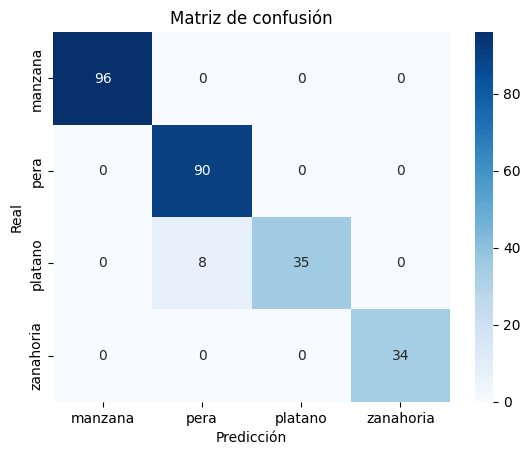

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

mat = confusion_matrix(y_test, y_pred, labels=clf.classes_)
sns.heatmap(mat, annot=True, fmt="d", xticklabels=clf.classes_, yticklabels=clf.classes_, cmap="Blues")
plt.xlabel("Predicción")
plt.ylabel("Real")
plt.title("Matriz de confusión")
plt.show()

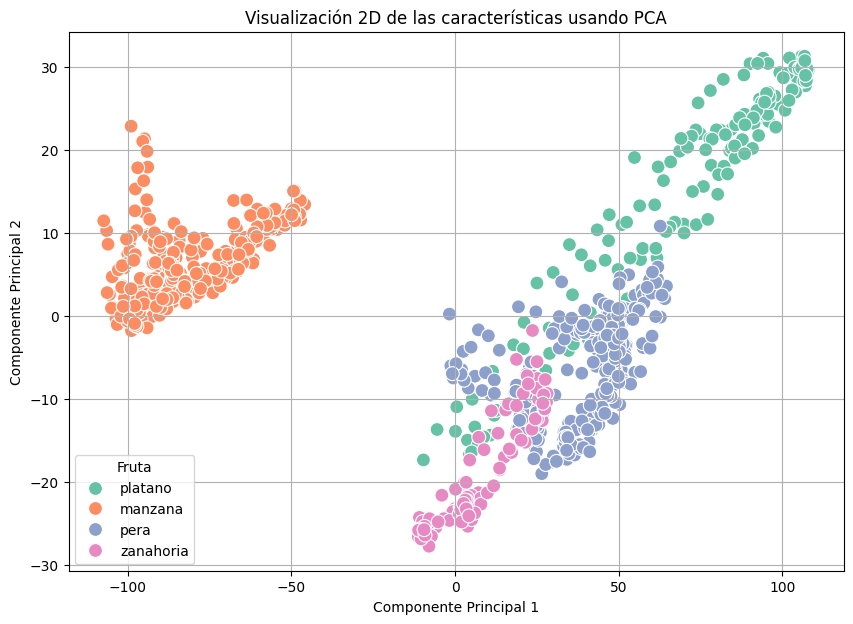

In [ ]:
from sklearn.decomposition import PCA
import seaborn as sns
import pandas as pd

# Aplica PCA para reducir las dimensiones a 2
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Crea un DataFrame para facilitar la visualización
df_pca = pd.DataFrame()
df_pca["PCA1"] = X_pca[:, 0]
df_pca["PCA2"] = X_pca[:, 1]
df_pca["Etiqueta"] = y

# Visualización
plt.figure(figsize=(10, 7))
sns.scatterplot(data=df_pca, x="PCA1", y="PCA2", hue="Etiqueta", palette="Set2", s=100)
plt.title("Visualización 2D de las características usando PCA")
plt.xlabel("Componente Principal 1")
plt.ylabel("Componente Principal 2")
plt.legend(title="Fruta")
plt.grid(True)
plt.show()


Saving r0_45.jpg to r0_45.jpg
 El modelo predice que es una: **platano**


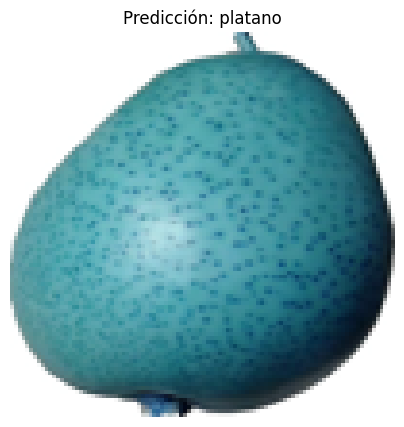

In [ ]:
from google.colab import files
from PIL import Image
import io

# Subir archivo desde tu equipo
uploaded = files.upload()

# Tomar el nombre del archivo
for nombre_archivo in uploaded.keys():
    # Leer imagen
    img_bytes = uploaded[nombre_archivo]
    img = Image.open(io.BytesIO(img_bytes)).convert('RGB')
    img = img.resize((100, 100))
    img_np = np.array(img)

    # --- Procesamiento similar al entrenamiento ---
    color_mean = np.mean(img_np, axis=(0, 1))

    gris = cv2.cvtColor(img_np, cv2.COLOR_RGB2GRAY)
    bordes = cv2.Canny(gris, 100, 200)
    contornos, _ = cv2.findContours(bordes, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    num_contornos = len(contornos)
    area_media = np.mean([cv2.contourArea(c) for c in contornos]) if contornos else 0

    # Vector de características
    nueva_entrada = np.array([[color_mean[0], color_mean[1], color_mean[2], num_contornos, area_media]])

    # --- Predicción ---
    pred = clf.predict(nueva_entrada)
    print(f" El modelo predice que es una: **{pred[0]}**")

    # Mostrar imagen
    mostrar_imagen(img_np, titulo=f"Predicción: {pred[0]}")

En el resultado anterior, podemos ver que si se ingresa la imagen de una pera la confunde con la de un platano

## Realizando un entrenamiento con Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

# Dividir datos como antes
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Crear el clasificador Random Forest
rf_model = RandomForestClassifier(n_estimators=100, max_depth=None, random_state=42)

# Entrenamiento
rf_model.fit(X_train, y_train)

# Predicción
y_pred_rf = rf_model.predict(X_test)

# Evaluación
print("📋 Reporte de clasificación con Random Forest:")
print(classification_report(y_test, y_pred_rf))


📋 Reporte de clasificación con Random Forest:
              precision    recall  f1-score   support

     manzana       1.00      1.00      1.00        96
        pera       0.98      1.00      0.99        90
     platano       1.00      0.95      0.98        43
   zanahoria       1.00      1.00      1.00        34

    accuracy                           0.99       263
   macro avg       0.99      0.99      0.99       263
weighted avg       0.99      0.99      0.99       263



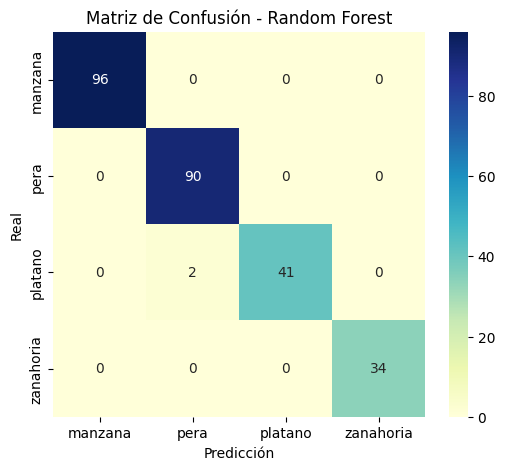

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

labels = sorted(np.unique(y))  # Las clases en orden alfabético
mat = confusion_matrix(y_test, y_pred_rf, labels=labels)

plt.figure(figsize=(6,5))
sns.heatmap(mat, annot=True, fmt="d", cmap="YlGnBu", xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicción")
plt.ylabel("Real")
plt.title("Matriz de Confusión - Random Forest")
plt.show()


Saving r0_101.jpg to r0_101.jpg
 El modelo Random Forest predice que es una: **platano**


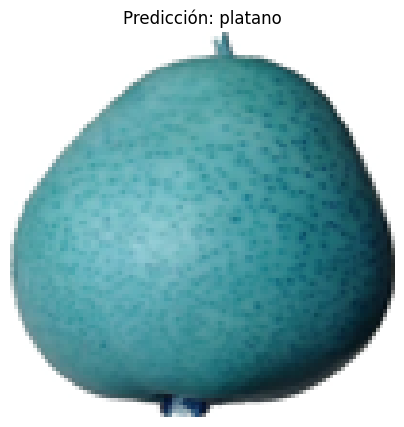

In [ ]:
from google.colab import files
from PIL import Image
import io

# Subir imagen
uploaded = files.upload()

# Clasificar imagen
for nombre_archivo in uploaded.keys():
    # Leer imagen
    img_bytes = uploaded[nombre_archivo]
    img = Image.open(io.BytesIO(img_bytes)).convert('RGB')
    img = img.resize((100, 100))
    img_np = np.array(img)

    # --- Mismo preprocesamiento que antes ---
    color_mean = np.mean(img_np, axis=(0, 1))
    gris = cv2.cvtColor(img_np, cv2.COLOR_RGB2GRAY)
    bordes = cv2.Canny(gris, 100, 200)
    contornos, _ = cv2.findContours(bordes, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    num_contornos = len(contornos)
    area_media = np.mean([cv2.contourArea(c) for c in contornos]) if contornos else 0

    # Vector de características
    nueva_entrada = np.array([[color_mean[0], color_mean[1], color_mean[2], num_contornos, area_media]])

    # --- Predicción con Random Forest ---
    pred = rf_model.predict(nueva_entrada)

    print(f" El modelo Random Forest predice que es una: **{pred[0]}**")

    # Mostrar imagen
    mostrar_imagen(img_np, titulo=f"Predicción: {pred[0]}")


Con este entrenamiento aun no es suficiente para que el modelo pueda distinguir la diferencia entre una imagen de una pera y un platano

# Probando con un contraste de colores

In [ ]:
!pip install mahotas # análisis y procesamiento de imágenes

In [ ]:
# Instalar mahotas si es necesario
import mahotas
from skimage.feature import hog
from sklearn.preprocessing import StandardScaler

#  Extraer Haralick y HOG
X_mejorado = []

for img in imagenes:
    # Convertir a escala de grises
    gris = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Haralick
    haralick = mahotas.features.haralick(gris).mean(axis=0)

    # HOG
    hog_feat = hog(gris, orientations=8, pixels_per_cell=(16, 16),
                   cells_per_block=(1, 1), visualize=False, feature_vector=True)

    # Color promedio y contornos (ya los habías calculado)
    color_mean = np.mean(img, axis=(0, 1))
    bordes = cv2.Canny(gris, 100, 200)
    contornos, _ = cv2.findContours(bordes, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    num_contornos = len(contornos)
    area_media = np.mean([cv2.contourArea(c) for c in contornos]) if contornos else 0

    # Concatenar todas las características
    features = np.concatenate([
        color_mean,
        [num_contornos, area_media],
        haralick,
        hog_feat
    ])

    X_mejorado.append(features)

X_mejorado = np.array(X_mejorado)

# Escalamos las características (muy recomendable con Haralick y HOG)
scaler = StandardScaler()
X_mejorado = scaler.fit_transform(X_mejorado)

# Reentrenar el modelo
X_train2, X_test2, y_train2, y_test2 = train_test_split(X_mejorado, y, test_size=0.3, random_state=42)
clf2 = DecisionTreeClassifier(max_depth=5, random_state=42)
clf2.fit(X_train2, y_train2)

# Evaluación
y_pred2 = clf2.predict(X_test2)
print("Resultados con Haralick y HOG:")
print(classification_report(y_test2, y_pred2))


Resultados con Haralick y HOG:
              precision    recall  f1-score   support

     manzana       1.00      1.00      1.00        96
        pera       1.00      1.00      1.00        90
     platano       1.00      1.00      1.00        43
   zanahoria       1.00      1.00      1.00        34

    accuracy                           1.00       263
   macro avg       1.00      1.00      1.00       263
weighted avg       1.00      1.00      1.00       263



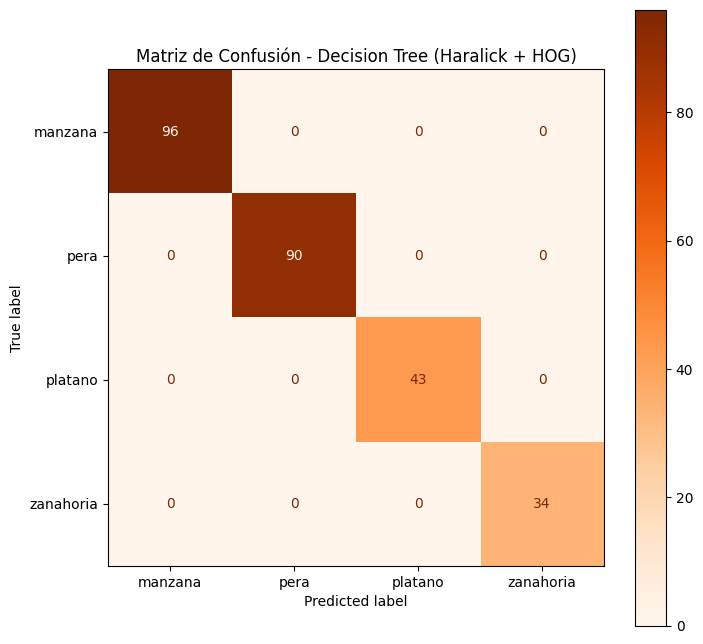

In [ ]:
# Matriz de confusión
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Calcular la matriz de confusión para las predicciones del segundo modelo
cm2 = confusion_matrix(y_test2, y_pred2, labels=clf2.classes_)

# Crear el gráfico de matriz de confusión
disp2 = ConfusionMatrixDisplay(confusion_matrix=cm2, display_labels=clf2.classes_)

# Mostrar la matriz con un mapa de colores y etiquetas
fig, ax = plt.subplots(figsize=(8, 8))
disp2.plot(cmap=plt.cm.Oranges, ax=ax)
plt.title("Matriz de Confusión - Decision Tree (Haralick + HOG)")
plt.show()


Saving r0_69.jpg to r0_69.jpg
Predicción: zanahoria


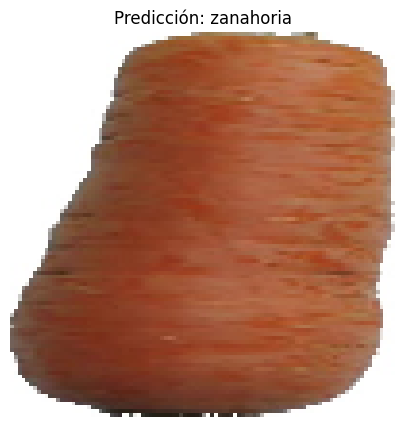

In [ ]:
from google.colab import files
from PIL import Image

# Subida de archivo por el usuario
uploaded = files.upload()

for nombre_archivo in uploaded.keys():
    # Leer imagen
    img = cv2.imread(nombre_archivo)
    img = cv2.resize(img, (100, 100))
    gris = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Extraer características (igual que en entrenamiento)
    color_mean = np.mean(img, axis=(0, 1))
    bordes = cv2.Canny(gris, 100, 200)
    contornos, _ = cv2.findContours(bordes, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    num_contornos = len(contornos)
    area_media = np.mean([cv2.contourArea(c) for c in contornos]) if contornos else 0

    haralick = mahotas.features.haralick(gris).mean(axis=0)
    hog_feat = hog(gris, orientations=8, pixels_per_cell=(16, 16),
                   cells_per_block=(1, 1), visualize=False, feature_vector=True)

    # Unir todas las características
    features_img = np.concatenate([
        color_mean,
        [num_contornos, area_media],
        haralick,
        hog_feat
    ])

    # Escalar como en el entrenamiento
    features_img = scaler.transform([features_img])

    # Predicción
    prediccion = clf2.predict(features_img)[0]
    print(f"Predicción: {prediccion}")

    # Mostrar imagen
    mostrar_imagen(img, titulo=f"Predicción: {prediccion}")


Con este cambio a color podemos ver que la imagen es mas nitida para el modelo permitiendo identificar de mejor manera las frutas con las que fue entrenado